# 손동작 의도(grip/spread) 분류 EEG 디코더로 AmazingHand 구동

`neural-to-output` 프로젝트와 독립적인 sandbox입니다 (`pyproject.toml`/`uv.lock` 미수정, `01_explore_eeg_decoder.ipynb`와
같은 `examples` 의존성 그룹만 사용합니다).

**목표**: EEG 신호를 grip(쥐기)/spread(펴기) 두 클래스로 분류하는 디코더를 만들고, 그 출력을
`n2o.decoder.Decoder` 서브클래스로 감싸서 `N2O` 파이프라인을 통해 `n2o.robot.hand.AmazingHand`까지 명령을 전달합니다.
그리고 실제 [AmazingHand](https://github.com/pollen-robotics/AmazingHand) CAD로 만든 MuJoCo 모델을 직접
관절 제어해서, 그 명령대로 손이 움직이는 모습을 애니메이션으로 봅니다.

**공개 데이터셋 관련 캐비잇(caveat)**: grip/spread로 정확히 라벨링된 공개 EEG 데이터셋은 흔치 않습니다. 여기서는
`01_explore_eeg_decoder.ipynb`와 동일한 BCI Competition IV 2a (`BNCI2014_001`, moabb)를 재사용하되, `left_hand`/`right_hand`
두 모터 이미저리 클래스만 남기고 각각 grip/spread 손동작 의도의 stand-in으로 재해석합니다. 실제 grip/spread 라벨이 붙은
데이터셋(예: EEG 기반 grasp 의도 분류 연구)으로 교체해도 아래 파이프라인 구조는 그대로 유지됩니다.

**하드웨어 관련 캐비잇**: `AmazingHand.move()`는 아직 실제 드라이버가 없는 인터페이스 스텁입니다
(`CLAUDE.md`, `docs/tutorials/adding-a-component.md` 참고). 이 노트북은 명령이 `AmazingHand`까지 올바른 형태로
전달되는 것을 보여주고, 손이 실제로 움직이는 모습은 같은 로봇의 실제 CAD 기반 MuJoCo 시뮬레이션(`AmazingHandSim`,
아래 4절)으로 재생합니다 — 출처/라이선스는 `examples/assets/amazing_hand_right/NOTICE.md` 참고.

In [1]:
import os
import warnings

os.environ.setdefault(
    "MUJOCO_GL", "egl"
)  # 디스플레이 없는 환경에서도 오프스크린 렌더링

import matplotlib.pyplot as plt
import mne
import mujoco
import numpy as np
import torch
from braindecode.datasets import MOABBDataset
from braindecode.models import EEGNet
from braindecode.preprocessing import (
    Preprocessor,
    create_windows_from_events,
    exponential_moving_standardize,
    preprocess,
)
from IPython.display import HTML, display
from matplotlib import animation

from n2o import N2O
from n2o.command import Command, CommandConfig
from n2o.decoder import Decoder, DecoderConfig, DecoderType, FeatureType
from n2o.robot.arm import MockArm
from n2o.robot.hand import AmazingHand, RobotHand

warnings.filterwarnings("ignore")  # mne/braindecode의 사소한 UserWarning 숨김
mne.set_log_level("ERROR")  # mne의 시끄러운 필터 설계 로그(INFO) 숨김

## 1. EEG 데이터 로드 및 전처리

`01_explore_eeg_decoder.ipynb`와 동일한 subject 1 데이터를 다시 로드하고, 같은 밴드패스(4-38Hz) + 표준화
전처리를 적용합니다 (자세한 설명/시각화는 `01_explore_eeg_decoder.ipynb` 참고).

In [2]:
dataset = MOABBDataset(dataset_name="BNCI2014_001", subject_ids=[1])


def to_microvolts(data):
    return data * 1e6


preprocessors = [
    Preprocessor("pick_types", apply_on_array=False, eeg=True, meg=False, stim=False),
    Preprocessor(to_microvolts),  # V -> uV
    Preprocessor("filter", apply_on_array=False, l_freq=4.0, h_freq=38.0),
    Preprocessor(exponential_moving_standardize, factor_new=1e-3, init_block_size=1000),
]
preprocess(dataset, preprocessors)

raw = dataset.datasets[0].raw
print("preprocessed n_channels:", len(raw.ch_names))
print("preprocessed data shape:", raw.get_data().shape)

preprocessed n_channels: 22
preprocessed data shape: (22, 96735)


## 2. 윈도잉 + grip/spread 2클래스로 필터링

이 데이터셋의 클래스 순서는 `["feet", "left_hand", "right_hand", "tongue"]`입니다. 여기서는
`left_hand` -> `grip`, `right_hand` -> `spread`로 재해석하고, 나머지 두 클래스(`feet`, `tongue`)는 제외합니다.

In [3]:
GESTURE_NAMES = ["grip", "spread"]
_ORIGINAL_TO_GESTURE = {1: 0, 2: 1}  # left_hand(1)->grip(0), right_hand(2)->spread(1)

sfreq = dataset.datasets[0].raw.info["sfreq"]
trial_start_offset_samples = int(-0.5 * sfreq)
cue_duration_s = dataset.datasets[0].raw.annotations.duration[0]

windows_dataset = create_windows_from_events(
    dataset,
    trial_start_offset_samples=trial_start_offset_samples,
    trial_stop_offset_samples=0,
    preload=True,
)


class GestureSubset(torch.utils.data.Dataset):
    """원본 4클래스 windows_dataset에서 grip/spread에 해당하는 트라이얼만 남기고 라벨을 재매핑합니다."""

    def __init__(self, base):
        self.base = base
        self.index_map = [
            (i, _ORIGINAL_TO_GESTURE[base[i][1]])
            for i in range(len(base))
            if base[i][1] in _ORIGINAL_TO_GESTURE
        ]

    def __len__(self):
        return len(self.index_map)

    def __getitem__(self, idx):
        base_idx, gesture_label = self.index_map[idx]
        X, _, crop_inds = self.base[base_idx]
        return X, gesture_label, crop_inds


splitted = windows_dataset.split("session")
train_key, valid_key = list(splitted.keys())[:2]
train_set = GestureSubset(splitted[train_key])
valid_set = GestureSubset(splitted[valid_key])

X0, y0, _ = train_set[0]
n_chans, input_window_samples = X0.shape
print(f"grip/spread train trials: {len(train_set)}, valid trials: {len(valid_set)}")
print(f"n_chans={n_chans}, n_times={input_window_samples}")
print("한 샘플 라벨:", GESTURE_NAMES[y0])

grip/spread train trials: 144, valid trials: 144
n_chans=22, n_times=1125
한 샘플 라벨: spread


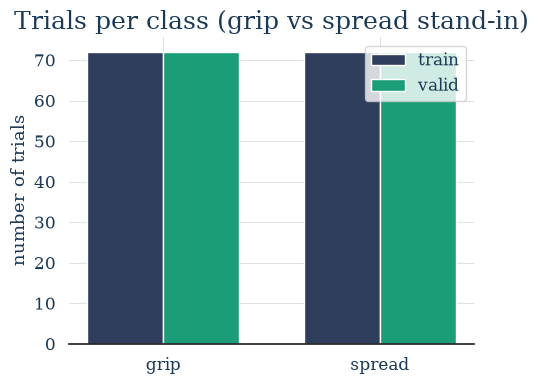

In [4]:
from collections import Counter

train_counts = Counter(train_set[i][1] for i in range(len(train_set)))
valid_counts = Counter(valid_set[i][1] for i in range(len(valid_set)))

x = np.arange(len(GESTURE_NAMES))
width = 0.35
fig, ax = plt.subplots(figsize=(5, 4))
ax.bar(x - width / 2, [train_counts[i] for i in range(2)], width, label="train")
ax.bar(x + width / 2, [valid_counts[i] for i in range(2)], width, label="valid")
ax.set_xticks(x)
ax.set_xticklabels(GESTURE_NAMES)
ax.set_ylabel("number of trials")
ax.set_title("Trials per class (grip vs spread stand-in)")
ax.legend()
plt.tight_layout()
plt.show()

## 3. `Decoder` 서브클래스: EEGNet 기반 grip/spread 분류기

`n2o.decoder.Decoder`를 상속해서 `decode(signal)`이 raw EEG 윈도우가 아니라 `{"gesture": "grip" | "spread"}`
형태의 명령을 반환하도록 감쌉니다. `output_type = FeatureType.ACTION`으로 선언하면 `N2O.run()`이 이 출력을
`Command`를 거쳐 로봇으로 전달합니다. `output_spec`을 명시해두면 `CommandConfig.verify_report()`가 다음
단계(로봇 손)의 `input_spec`과 이 값을 대조해줍니다.

In [5]:
class GripSpreadDecoder(Decoder):
    """EEGNet 기반 grip/spread 손동작 의도 분류 디코더."""

    output_type = FeatureType.ACTION

    def __init__(self, n_chans, n_times):
        self.input_spec = {"n_chans": n_chans, "n_times": n_times}
        self.output_spec = {"gesture": "grip | spread"}
        self.config = DecoderConfig(type=DecoderType.CLASSIFICATION)
        self.model = EEGNet(
            n_chans=n_chans, n_outputs=len(GESTURE_NAMES), n_times=n_times
        )

    @property
    def device(self):
        # print(model)이 내부적으로 torchinfo summary를 실행하면서 모델을 GPU로 옮길 수 있어,
        # 캐싱하지 않고 매번 모델의 실제 현재 위치를 조회합니다.
        return next(self.model.parameters()).device

    def decode(self, signal):
        self.model.eval()
        with torch.no_grad():
            x = torch.tensor(signal).unsqueeze(0).float().to(self.device)
            logits = self.model(x)
        gesture_idx = int(logits.argmax(dim=1).item())
        return {"gesture": GESTURE_NAMES[gesture_idx]}


class GripSpreadCommand(Command):
    """`decoded_signal`이 `{"gesture": ...}` 형태이므로, hand 쪽으로만 그대로 옮겨줍니다."""

    def translate(self, decoder, decoded_signal):
        return {
            "type": decoder.config.type,
            "arm": None,
            "hand": decoded_signal["gesture"],
        }


decoder = GripSpreadDecoder(n_chans=n_chans, n_times=input_window_samples)
print(decoder.model)

Layer (type (var_name):depth-idx)                            Input Shape               Output Shape              Param #                   Kernel Shape
EEGNet (EEGNet)                                              [1, 22, 1125]             [1, 2]                    --                        --
├─Ensure4d (ensuredims): 1-1                                 [1, 22, 1125]             [1, 22, 1125, 1]          --                        --
├─Rearrange (dimshuffle): 1-2                                [1, 22, 1125, 1]          [1, 1, 22, 1125]          --                        --
├─Conv2d (conv_temporal): 1-3                                [1, 1, 22, 1125]          [1, 8, 22, 1126]          512                       [1, 64]
├─BatchNorm2d (bnorm_temporal): 1-4                          [1, 8, 22, 1126]          [1, 8, 22, 1126]          16                        --
├─ParametrizedConv2dWithConstraint (conv_spatial): 1-5       [1, 8, 22, 1126]          [1, 16, 1, 1126]          --                  

## 4. 학습 sanity check

`01_explore_eeg_decoder.ipynb`와 동일하게, 작은 고정 배치 하나를 반복 학습시켜서 loss가 떨어지고
accuracy가 오르는지만 확인하는 오버피팅 sanity check입니다 (제대로 된 학습이 아님).

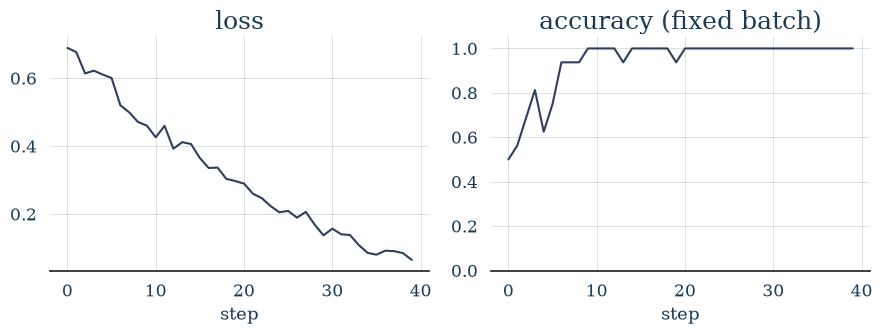

마지막 step: loss=0.0650, acc=1.00


In [6]:
decoder.model.train()
opt = torch.optim.Adam(decoder.model.parameters(), lr=1e-3)
loss_fn = torch.nn.CrossEntropyLoss()

n_batch = min(16, len(train_set))
xs = np.stack([train_set[i][0] for i in range(n_batch)])
ys = np.array([train_set[i][1] for i in range(n_batch)])
X_batch = torch.from_numpy(xs).float().to(decoder.device)
y_batch = torch.from_numpy(ys).long().to(decoder.device)

n_steps = 40
history = {"loss": [], "acc": []}
for step in range(n_steps):
    opt.zero_grad()
    logits = decoder.model(X_batch)
    loss = loss_fn(logits, y_batch)
    loss.backward()
    opt.step()
    acc = (logits.argmax(dim=1) == y_batch).float().mean().item()
    history["loss"].append(loss.item())
    history["acc"].append(acc)

fig, axes = plt.subplots(1, 2, figsize=(9, 3.5))
axes[0].plot(history["loss"])
axes[0].set_title("loss")
axes[0].set_xlabel("step")
axes[1].plot(history["acc"])
axes[1].set_title("accuracy (fixed batch)")
axes[1].set_xlabel("step")
axes[1].set_ylim(0, 1.05)
plt.tight_layout()
plt.show()

print(f"마지막 step: loss={history['loss'][-1]:.4f}, acc={history['acc'][-1]:.2f}")

## 5. MuJoCo로 실제 AmazingHand 모델 시각화하기

`n2o.robot.hand.AmazingHand`는 여전히 `NotImplementedError` 스텁이라 실제 손이 움직이는 걸 볼 수는
없습니다. 대신 pollen-robotics의 [AmazingHand](https://github.com/pollen-robotics/AmazingHand) 프로젝트가
공개한 실제 CAD 기반 MuJoCo 모델(`examples/assets/amazing_hand_right/`, 출처/라이선스는 같은 폴더의
`NOTICE.md` 참고)을 그대로 불러와서, 결정한 명령(`{"gesture": "grip" | "spread"}`)에 맞는 관절 목표값으로
직접 제어합니다. 원본 데모가 쓰는 IK(`mink`/`dora-rs`) 없이, 8개 관절(`finger{1-4}_motor{1,2}`) 위치 제어만
사용합니다.

두 pose는 실제로 렌더링해보며 확인했습니다: `grip`은 4개 손가락의 `motor1`을 전부 +1.4rad로 굽혀 쥐는
모양이고, `spread`는 모델의 기본(zero) pose로 손가락이 펴진 모양입니다.

In [7]:
ASSET_DIR = "assets/amazing_hand_right/mjcf"

GESTURE_CTRL = {
    "grip": np.array([1.4, 0.0] * 4),
    "spread": np.zeros(8),
}


class AmazingHandSim(RobotHand):
    """실제 AmazingHand MJCF 모델(MuJoCo)의 관절을 직접 움직여 시각화하는 RobotHand.

    실제 하드웨어(`AmazingHand.move()`)는 아직 구현되지 않았지만, 로봇 모델과 관절 이름은
    pollen-robotics/AmazingHand의 실제 CAD에서 나온 것입니다 (NOTICE.md 참고).
    """

    def __init__(self):
        self.input_spec = {"gesture": "grip | spread"}
        self.model = mujoco.MjModel.from_xml_path(f"{ASSET_DIR}/demo_scene.xml")
        self.data = mujoco.MjData(self.model)
        self.renderer = mujoco.Renderer(self.model, height=360, width=480)
        self.camera = mujoco.MjvCamera()
        mujoco.mjv_defaultCamera(self.camera)
        self.camera.distance = 0.35
        self.camera.azimuth = 120
        self.camera.elevation = -20
        self.camera.lookat = np.array([0.0, 0.0, 0.05])

    def _render_frame(self):
        self.renderer.update_scene(self.data, camera=self.camera)
        return self.renderer.render().copy()

    def move(self, decoder_type, command):
        target_ctrl = GESTURE_CTRL[command]
        start_ctrl = self.data.ctrl.copy()

        frames = []
        n_steps = 60
        for step in range(n_steps):
            alpha = (step + 1) / n_steps
            self.data.ctrl[:] = start_ctrl + alpha * (target_ctrl - start_ctrl)
            mujoco.mj_step(self.model, self.data)
            if step % 3 == 0:
                frames.append(self._render_frame())

        fig, ax = plt.subplots(figsize=(5, 4))
        im = ax.imshow(frames[0])
        ax.axis("off")
        ax.set_title(f"AmazingHand (MuJoCo sim) -> '{command}'")

        def update(i):
            im.set_data(frames[i])
            return [im]

        anim = animation.FuncAnimation(fig, update, frames=len(frames), interval=60)
        plt.close(fig)
        display(HTML(anim.to_jshtml()))


sim_hand = AmazingHandSim()
sim_hand.move(DecoderType.CLASSIFICATION, "grip")
sim_hand.move(DecoderType.CLASSIFICATION, "spread")

## 6. `N2O` 파이프라인으로 AmazingHand까지 명령 전달

`signal.read()`가 매번 같은 검증 샘플을 돌려주는 초간단 signal 소스로 `N2O`를 구성하고,
`n2o.robot.hand = AmazingHand()`를 그대로 연결합니다. `AmazingHand.move()`는 아직 스텁이라
`n2o.run()`이 그 단계에서 `NotImplementedError`를 냅니다 — 이는 하드웨어가 없어서가 아니라 드라이버가
아직 구현되지 않았기 때문입니다. 위에서 만든 `AmazingHandSim`으로 교체하면, 디코더가 실제로 예측한
gesture에 따라 손이 움직이는 모습을 볼 수 있습니다.

In [8]:
X_valid, y_valid, _ = valid_set[0]


class OneShotSignal:
    """decoder()에 넘길 신호 한 개를 반복해서 돌려주는 최소 signal 소스."""

    def __init__(self, sample):
        self.sample = sample

    def read(self):
        return self.sample


n2o = N2O()
n2o.signal = OneShotSignal(X_valid)
n2o.decoder = decoder
n2o.command = GripSpreadCommand()
n2o.robot.arm = MockArm()
n2o.robot.hand = AmazingHand()

n2o.command_config = CommandConfig()
print(n2o.command_config.verify_report(n2o))
print()
print("실제 라벨:", GESTURE_NAMES[y_valid])
print("디코더 명령:", decoder(X_valid))

단계      | 출력 스펙                 |    | 단계         | 입력 스펙                    | 상태
--------+-----------------------+----+------------+--------------------------+---
signal  | (미정)                  | -> | decoder    | n_chans=22, n_times=1125 | 미정
decoder | gesture=grip | spread | -> | command    | (미정)                     | 미정
command | (미정)                  | -> | robot.arm  | (미정)                     | 미정
command | (미정)                  | -> | robot.hand | (미정)                     | 미정

실제 라벨: grip
디코더 명령: {'gesture': 'grip'}


In [9]:
try:
    n2o.run()
except NotImplementedError:
    print(
        "AmazingHand.move()는 아직 실제 하드웨어 드라이버가 구현되지 않은 인터페이스 스텁입니다"
        " (docs/tutorials/adding-a-component.md 참고)."
    )
    print(
        "실제 손 모델이 움직이는 모습을 보기 위해 AmazingHandSim(MuJoCo)으로 교체합니다.\n"
    )

n2o.robot.hand = sim_hand

# decoder.output_spec과 sim_hand.input_spec이 정확히 같은 형태({"gesture": ...})이므로,
# 그 경계를 이어주는 command를 pass-through로 선언하면 verify_report()가 "match"로 확인해줍니다.
n2o.command_config = CommandConfig(
    input_feature=decoder.output_spec, output_feature=sim_hand.input_spec
)
print(n2o.command_config.verify_report(n2o))
print()
n2o.run()

MockArm.move(<DecoderType.CLASSIFICATION: 'CLASSIFICATION'>, None)
AmazingHand.move()는 아직 실제 하드웨어 드라이버가 구현되지 않은 인터페이스 스텁입니다 (docs/tutorials/adding-a-component.md 참고).
실제 손 모델이 움직이는 모습을 보기 위해 AmazingHandSim(MuJoCo)으로 교체합니다.

단계      | 출력 스펙                 |    | 단계         | 입력 스펙                    | 상태
--------+-----------------------+----+------------+--------------------------+---
signal  | (미정)                  | -> | decoder    | n_chans=22, n_times=1125 | 미정
decoder | gesture=grip | spread | -> | command    | gesture=grip | spread    | OK
command | gesture=grip | spread | -> | robot.arm  | (미정)                     | 미정
command | gesture=grip | spread | -> | robot.hand | gesture=grip | spread    | OK

MockArm.move(<DecoderType.CLASSIFICATION: 'CLASSIFICATION'>, None)


## 정리

- `Decoder` ABC를 상속해 EEGNet 출력을 `{"gesture": "grip" | "spread"}` 명령으로 감쌌고,
  `output_type = FeatureType.ACTION`으로 선언해 `N2O.run()`이 `Command`를 거쳐 로봇으로 명령을
  보내도록 했습니다. `decoder(signal)`처럼 인스턴스를 함수처럼 호출할 수 있습니다.
- `GripSpreadCommand`는 디코더의 `{"gesture": ...}` 출력을 `robot.hand`가 받는 값(문자열)으로만
  옮겨주는 가장 단순한 `Command` 서브클래스입니다.
- `CommandConfig.verify_report()`는 로봇 손 단계와 항상 command를 거쳐 비교합니다. command를
  pass-through로 선언해보면, 디코더 `output_spec`과 `AmazingHandSim`의 `input_spec`이 정확히 같은
  형태라 그 경계가 실제로 "match"로 뜨는 것을 확인했습니다 (실제 `AmazingHand`는 아직 `input_spec`이
  정해지지 않아 command 없이는 "미정"으로 남습니다).
- `AmazingHand.move()`가 구현되기 전까지는, `pollen-robotics/AmazingHand`의 실제 CAD로 만든 MuJoCo
  모델을 직접 관절 제어해서 명령대로 손이 움직이는 모습을 그대로 확인할 수 있습니다 (`AmazingHandSim`).
- 실제 grip/spread 라벨이 붙은 EEG 데이터셋과 `AmazingHand`의 실제 하드웨어 드라이버가 준비되면, 이
  노트북의 `n2o.signal`/`n2o.robot.hand` 두 곳만 실제 구현으로 바꿔 끼우면 됩니다.